In [5]:
import numpy as np                    # For numerical operations and array handling
import matplotlib.pyplot as plt        # For displaying images and plots
import imageio.v3 as iio               # For loading/saving images (preferred)
import cv2                             # OpenCV for computer vision operations
import skimage as sk
import skimage.io as skio
from skimage import io, img_as_ubyte, color
from skimage.transform import rescale, resize
from scipy import signal
import time
import json
import helper


In [6]:
def normalize(img):
    return (img - np.min(img)) / (np.max(img) - np.min(img))

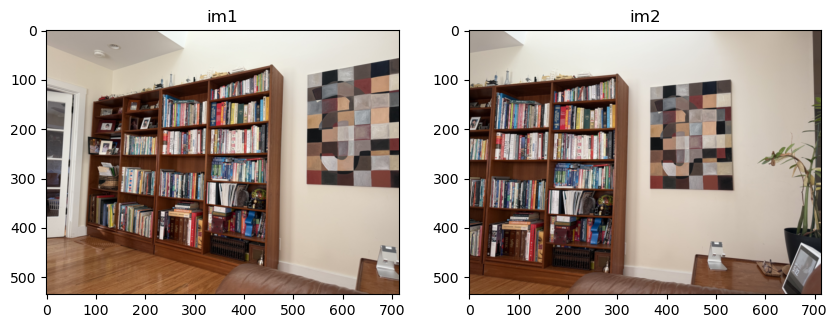

In [7]:
%matplotlib inline
im1 = iio.imread('./data/part1/living_room1.png')
im2 = iio.imread('./data/part1/living_room2.png')

new_shape_1 = (im1.shape[0] // 8, im1.shape[1] // 8)
new_shape_2 = (im2.shape[0] // 8, im2.shape[1] // 8)

im1 = resize(im1, new_shape_1, anti_aliasing=True)
im2 = resize(im2, new_shape_2, anti_aliasing=True)

#iio.imwrite("./data/fridge_1_small.png", img_as_ubyte(im1))
#iio.imwrite("./data/fridge_2_small.png", img_as_ubyte(im2))

plt.figure(figsize=(10,5))

plt.subplot(1, 2, 1)   # second plot
plt.imshow(im1)
plt.title("im1")

plt.subplot(1, 2, 2)   # 1 row, 2 columns, first plot
plt.imshow(im2)
plt.title("im2")

plt.show()


In [8]:
def createA(im1_point, im2_point):
    x = im1_point[0]
    y = im1_point[1]
    x_prime = im2_point[0]
    y_prime = im2_point[1]
    row_1 = [x, y, 1, 0, 0, 0, -1 * x * x_prime, -1 * y * x_prime]
    row_2 = [0, 0, 0, x, y, 1, -1 * x * y_prime, -1 * y * y_prime]
    return np.array([row_1, row_2])
            
def computeH(im1_points, im2_points):
    A = np.empty((0, 8))
    for i in range(len(im1_points)):
        rows = createA(im1_points[i], im2_points[i])
        A = np.vstack([A, rows])
    b = np.array(im2_points).flatten()
    #if len(im1_points) == 4:
        # Exact solution using np.linalg.solve
    #    h = np.linalg.solve(A, b)
    #elif len(im1_points) > 4:
        # Overdetermined, solve using least squares
    h, residuals, rank, s = np.linalg.lstsq(A, b)
    #else:
    #    raise ValueError("At least 4 points are required to compute homography.")

    H = np.append(h, 1).reshape(3, 3)
    return H

In [9]:
from helper import get_points
#with open('./data/fridge_1_small_fridge_2_small.json', 'r') as f:
#    correspondences = json.load(f)

#sanity check
#print(correspondences.keys())
#print(correspondences['im1Points'])
%matplotlib qt
correspondences = get_points(im1, im2)



Click corresponding points between the two images (left ↔ right).
Click on Image 1, then on Image 2, alternating.
Press Enter (or right-click) when done.

Select next point on Image 1 (press Enter when done)...
Select corresponding point on Image 2...

Select next point on Image 1 (press Enter when done)...
Select corresponding point on Image 2...

Select next point on Image 1 (press Enter when done)...
Select corresponding point on Image 2...

Select next point on Image 1 (press Enter when done)...
Select corresponding point on Image 2...

Select next point on Image 1 (press Enter when done)...
Finished selecting points.

Collected 4 point pairs.
Points Image 1: [(236, 122), (454, 72), (224, 425), (434, 474)]
Points Image 2: [(59, 119), (296, 88), (35, 462), (278, 489)]


In [10]:
def show_selected_points(im1, im2, points):
    points_1, points_2 = points  # unpack
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
    ax1.imshow(im1)
    ax2.imshow(im2)

    ax1.set_title("Image 1 (with selected points)")
    ax2.set_title("Image 2 (with selected points)")

    # plot points on image 1
    for i, (x, y) in enumerate(points_1):
        ax1.plot(x, y, 'ro', markersize=6)
        ax1.text(x + 5, y - 5, f"{i+1}", color='black', fontsize=10, weight='bold')

    # plot points on image 2
    for i, (x, y) in enumerate(points_2):
        ax2.plot(x, y, 'ro', markersize=6)
        ax2.text(x + 5, y - 5, f"{i+1}", color='black', fontsize=10, weight='bold')

    plt.tight_layout()
    plt.show()

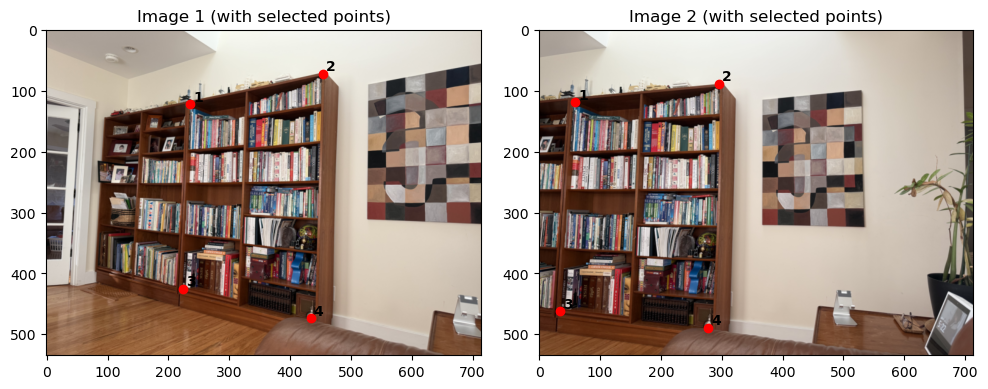

In [11]:
%matplotlib inline

    

show_selected_points(im1, im2, correspondences)


In [12]:
plt.close('all')
%matplotlib inline
H = computeH(correspondences[0], correspondences[1])
np.set_printoptions(precision=4, suppress=True)
print(H)

[[   1.4568   -0.0396 -271.2968]
 [   0.1818    1.2198  -55.2428]
 [   0.0007   -0.0002    1.    ]]


In [13]:
pts1 = np.array(correspondences[0], dtype=float)
pts1_h = np.hstack([pts1, np.ones((pts1.shape[0], 1))])  
mapped_h = (H @ pts1_h.T).T  
mapped = mapped_h[:, :2] / mapped_h[:, [2]]
print(mapped)

[[ 59. 119.]
 [296.  88.]
 [ 35. 462.]
 [278. 489.]]


In [14]:
#is our H stable? Yes it seems so since H << 10^8
print(np.linalg.cond(H))
print(H)

46001.611658955684
[[   1.4568   -0.0396 -271.2968]
 [   0.1818    1.2198  -55.2428]
 [   0.0007   -0.0002    1.    ]]


In [15]:
def corner_boundaries(im, H):
    height, width = im.shape[:2] 

    #lets pipe through H to find the bounding box
    corners_h = np.array([
        [0, 0, 1],            # top-left
        [width - 1, 0, 1],    # top-right
        [0, height - 1, 1],   # bottom-left
        [width - 1, height - 1, 1]  # bottom-right
    ])

    # apply homography
    warped_corners = (H @ corners_h.T).T  # shape (4,3)

    # dehomogenize
    warped_corners /= warped_corners[:, [2]]
    return warped_corners

def warpImageNearestNeighbor(im, H):
    #lets warp each corner through the H matrix
    height, width = im.shape[:2] 

    warped_corners = corner_boundaries(im, H)

    x_min, y_min = np.floor(warped_corners[:,0].min()), np.floor(warped_corners[:,1].min())
    x_max, y_max = np.ceil(warped_corners[:,0].max()), np.ceil(warped_corners[:,1].max())
    
    width_new = int(x_max - x_min)
    height_new = int(y_max - y_min)

    warped = np.zeros((height_new, width_new, im.shape[2]), dtype=im.dtype)  
    H_inv = np.linalg.inv(H)
    
    for y in range(height_new):
        for x in range(width_new):
            origin_location = H_inv @ np.array([x + x_min, y + y_min, 1])
            origin_location /= origin_location[-1]
            x_origin = int(np.round(origin_location[0]))
            y_origin = int(np.round(origin_location[1]))
            if (0<= y_origin < height and 0<= x_origin <width):
                warped[y, x, :] = im[y_origin, x_origin, :]
            

    return warped



In [16]:
def warpImageNearestNeighborFast(im, H):
    height, width = im.shape[:2]

    corners_h = np.array([
        [0, 0, 1],
        [width - 1, 0, 1],
        [0, height - 1, 1],
        [width - 1, height - 1, 1]
    ])
    warped_corners = (H @ corners_h.T).T
    warped_corners /= warped_corners[:, [2]]
    x_min, y_min = np.floor(warped_corners[:, 0].min()), np.floor(warped_corners[:, 1].min())
    x_max, y_max = np.ceil(warped_corners[:, 0].max()), np.ceil(warped_corners[:, 1].max())
    width_new = int(x_max - x_min)
    height_new = int(y_max - y_min)

    ys, xs = np.meshgrid(np.arange(height_new), np.arange(width_new), indexing='ij')
    coords = np.stack([xs + x_min, ys + y_min, np.ones_like(xs)], axis=-1).reshape(-1, 3)

    H_inv = np.linalg.inv(H)
    coords_in = coords @ H_inv.T
    coords_in /= coords_in[:, [2]]

    x_in = np.round(coords_in[:, 0]).astype(int)
    y_in = np.round(coords_in[:, 1]).astype(int)

    valid = (x_in >= 0) & (x_in < width) & (y_in >= 0) & (y_in < height)

    warped = np.zeros((height_new, width_new, im.shape[2]), dtype=im.dtype)

    if im.ndim == 3:
        for c in range(im.shape[2]):
            warped[..., c].flat[valid] = im[y_in[valid], x_in[valid], c]
    else:
        warped.flat[valid] = im[y_in[valid], x_in[valid]]

    return warped


In [17]:
print(corner_boundaries(im1, H)[:,0].max())

526.3628802121902


In [18]:
warped_im = warpImageNearestNeighbor(im1, H)

float64


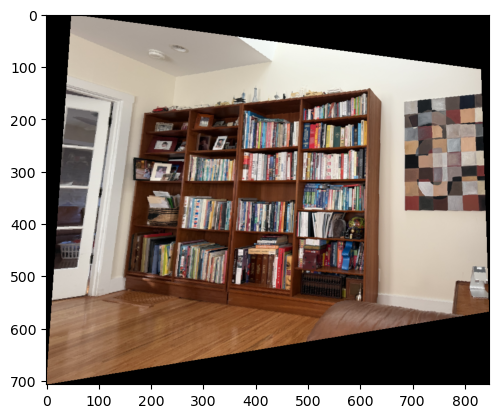

In [19]:
%matplotlib inline
plt.imshow(warped_im)
print(warped_im.dtype)

iio.imwrite("./output/living_room_NN.jpg", img_as_ubyte(warped_im))

In [20]:
def warpImageBilinear(im, H):
    height, width = im.shape[:2] 

    warped_corners = corner_boundaries(im, H)
    print(warped_corners)
    x_min, y_min = np.floor(warped_corners[:,0].min()), np.floor(warped_corners[:,1].min())
    x_max, y_max = np.ceil(warped_corners[:,0].max()), np.ceil(warped_corners[:,1].max())
    
    width_new = int(x_max - x_min)
    height_new = int(y_max - y_min)

    warped = np.zeros((height_new, width_new, 3), dtype=im.dtype)  
    H_inv = np.linalg.inv(H)
    
    for y in range(height_new):
        for x in range(width_new):
            origin_location = H_inv @ np.array([x + x_min, y + y_min, 1])
            origin_location /= origin_location[-1]
            #lets calculate the weighted sum
            x_origin = origin_location[0]
            y_origin = origin_location[1]
            x0 = int(np.floor(x_origin)) #lets get the floored pairs
            y0 = int(np.floor(y_origin)) 
            x1 = x0 + 1
            y1 = y0 + 1

            w00 = (x1 - x_origin) * (y1 - y_origin)
            w10 = (x_origin - x0) * (y1 - y_origin)
            w01 = (x1 - x_origin) * (y_origin - y0)
            w11 = (x_origin - x0) * (y_origin - y0)
            #check if in bounds
            if (0<= y0 < height and 0<= x0 <width):
                warped[y, x, :3] += im[y0, x0, :3] * w00
                #warped[y, x, 3] = 1
            if (0<= y0 < height and 0<= x1 < width):
                warped[y,x, :3] += im[y0, x1, :3] * w10
                #warped[y, x, 3] = 1
            if (0<=y1<height and 0<=x0<width):
                warped[y,x,:3] += im[y1, x0, :3] * w01
                #warped[y, x, 3] = 1
            if (0<=y1<height and 0<=x1<width):
                warped[y,x,:3] += im[y1, x1, :3] * w11
                #warped[y, x, 3] = 1
    
    warped = np.clip(warped, 0, 255)
    return warped

[[-271.2968  -55.2428    1.    ]
 [ 510.9665   49.5271    1.    ]
 [-319.3333  650.9025    1.    ]
 [ 526.3629  511.9322    1.    ]]
float64


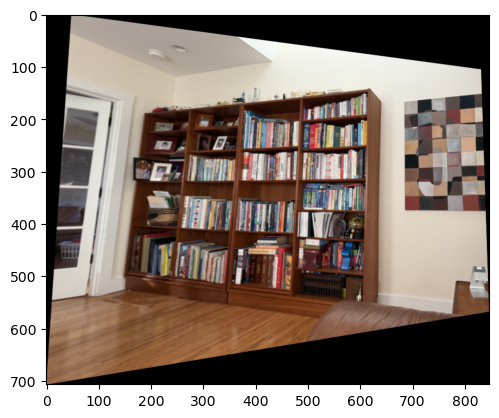

In [21]:
%matplotlib inline
warped_im_bilinear = warpImageBilinear(im1, H)
plt.imshow(warped_im_bilinear)
print(im1.dtype)

iio.imwrite("./output/living_room_bilinear.jpg", img_as_ubyte(warped_im_bilinear))


Lets try and rectify something

In [22]:
def rectification_bilinear(im, rect_points, H):
    height, width = im.shape[:2] 

    
    width_new = rect_points[3][0]
    height_new = rect_points[3][1]

    warped = np.zeros((height_new, width_new, 3), dtype=im.dtype)  
    H_inv = np.linalg.inv(H)
    
    for y in range(height_new):
        for x in range(width_new):
            origin_location = H_inv @ np.array([x, y, 1])
            origin_location /= origin_location[-1]
            #lets calculate the weighted sum
            x_origin = origin_location[0]
            y_origin = origin_location[1]
            x0 = int(np.floor(x_origin)) #lets get the floored pairs
            y0 = int(np.floor(y_origin)) 
            x1 = x0 + 1
            y1 = y0 + 1

            w00 = (x1 - x_origin) * (y1 - y_origin)
            w10 = (x_origin - x0) * (y1 - y_origin)
            w01 = (x1 - x_origin) * (y_origin - y0)
            w11 = (x_origin - x0) * (y_origin - y0)
            #check if in bounds
            if (0<= y0 < height and 0<= x0 <width):
                warped[y, x, :3] += im[y0, x0, :3] * w00
                #warped[y, x, 3] = 1
            if (0<= y0 < height and 0<= x1 < width):
                warped[y,x, :3] += im[y0, x1, :3] * w10
                #warped[y, x, 3] = 1
            if (0<=y1<height and 0<=x0<width):
                warped[y,x,:3] += im[y1, x0, :3] * w01
                #warped[y, x, 3] = 1
            if (0<=y1<height and 0<=x1<width):
                warped[y,x,:3] += im[y1, x1, :3] * w11
                #warped[y, x, 3] = 1
    
    warped = np.clip(warped, 0, 255)
    return warped

def rectification_NN(im, rect_points, H):
    height, width = im.shape[:2] 

    
    width_new = rect_points[3][0]
    height_new = rect_points[3][1]

    warped = np.zeros((height_new, width_new, 3), dtype=im.dtype)  
    H_inv = np.linalg.inv(H)
    
    for y in range(height_new):
        for x in range(width_new):
            origin_location = H_inv @ np.array([x, y, 1])
            origin_location /= origin_location[-1]
            x_origin = int(np.round(origin_location[0]))
            y_origin = int(np.round(origin_location[1]))
            if (0<= y_origin < height and 0<= x_origin <width):
                warped[y, x, :] = im[y_origin, x_origin, :]
    
    return warped

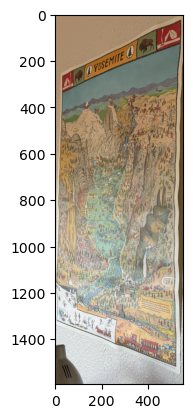

In [23]:
%matplotlib inline
surface = iio.imread('./data/part1/poster_cropped.png')
#alignment = iio.imread('./data/part1/poster_rectification.png')

new_shape_1 = (surface.shape[0] // 2, surface.shape[1] // 2)
surface = resize(surface, new_shape_1, anti_aliasing=True)

#iio.imwrite('./output/poster_small.jpg', img_as_ubyte(surface))
#new_shape_2 = (alignment.shape[0] // 8, alignment.shape[1] // 8)
#alignment = resize(alignment, new_shape_2, anti_aliasing=True)

plt.imshow(surface)

In [24]:
print(surface.dtype)

float64


In [25]:
from helper import get_points_for_rectification
%matplotlib qt

points = get_points_for_rectification(surface)




Please select 4 points in the image for rectification.
Click in the order: top-left, top-right, bottom-left, bottom-right.
Press Enter (or right-click) when done.

Select point 1...

Select point 2...

Select point 3...

Select point 4...

Collected 4 points for rectification.
Points: [(20, 254), (546, 8), (2, 1320), (528, 1530)]


In [26]:
%matplotlib inline
height = 750
width = 500
corners = [
    (0, 0),                # top-left
    (width, 0),        # top-right
    (0, height),       # bottom-left
    (width, height)  # bottom-right
]
H_new = computeH(points, corners)

print(H_new)

[[   1.3965    0.0236  -33.9184]
 [   0.3427    0.7329 -192.999 ]
 [   0.0008    0.        1.    ]]


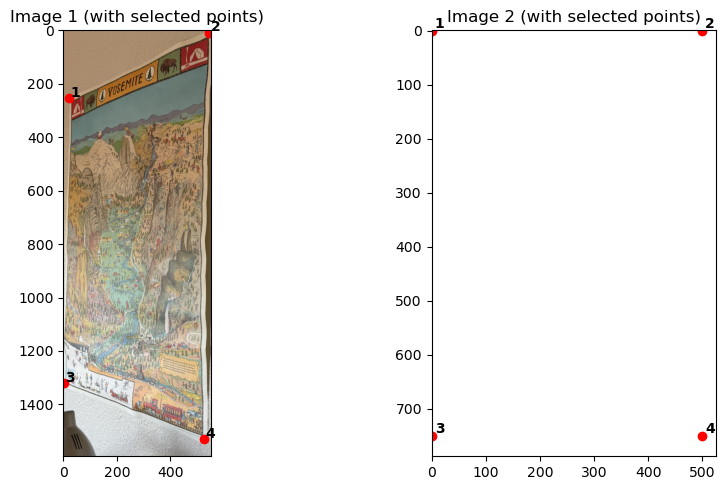

[[  0.   0.]
 [500.  -0.]
 [ -0. 750.]
 [500. 750.]]


In [27]:
%matplotlib inline
alignment = np.ones((height, width, 3), dtype=surface.dtype)
show_selected_points(surface, alignment, [points, corners])


pts1 = np.array(points, dtype=float)
pts1_h = np.hstack([pts1, np.ones((pts1.shape[0], 1))])  
mapped_h = (H_new @ pts1_h.T).T  
mapped = mapped_h[:, :2] / mapped_h[:, [2]]
print(mapped)


In [28]:
corner_boundaries(surface, H_new)

array([[ -33.9184, -192.999 ,    1.    ],
       [ 503.2816,   -2.839 ,    1.    ],
       [   3.5326,  939.1852,    1.    ],
       [ 515.4871,  776.1272,    1.    ]])

In [29]:
poster_bilinear = rectification_bilinear(surface, corners ,H_new)
poster_nn = rectification_NN(surface, corners, H_new)

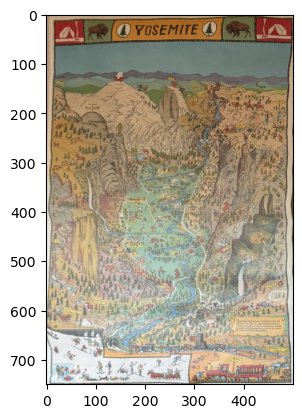

In [30]:
plt.imshow(poster_bilinear)
iio.imwrite("./output/poster_bilinear.jpg", img_as_ubyte(poster_bilinear))
iio.imwrite("./output/poster_NN.jpg", img_as_ubyte(poster_nn))

In [31]:
print(surface.dtype)

float64


In [32]:
def createMosaics(im1, im2, H):



    h_base, w_base = im2.shape[:2]
    base_corners = np.array([
    [0, 0],
    [w_base-1, 0],
    [0, h_base-1],
    [w_base-1, h_base-1]
    ])

    warped_corners = corner_boundaries(im1, H)[:, :2]

    all_corners = np.vstack([base_corners, warped_corners])
    x_min, y_min = np.floor(all_corners[:,0].min()), np.floor(all_corners[:,1].min()) 
    x_max, y_max = np.ceil(all_corners[:,0].max()), np.ceil(all_corners[:,1].max())

    canvas_width = int(x_max - x_min) 
    canvas_height = int(y_max - y_min) 
    
    mosaic_im1 = np.zeros((canvas_height + 1, canvas_width + 1, 3), dtype=im2.dtype)
    
    mosaic_im2 = np.zeros((canvas_height + 1, canvas_width + 1, 3), dtype=im2.dtype)

    offset_x = int(-x_min)
    offset_y = int(-y_min)

    

    warped_im1 = warpImageBilinear(im1, H)   # your warped image
    h_warped, w_warped = warped_im1.shape[:2]
    
    #just need to figure o  ut blending


    mosaic_im1[0:h_warped, 0:w_warped, :3] = warped_im1
    mosaic_im2[offset_y: offset_y + h_base, offset_x: offset_x+w_base, :] = im2
    
    
    return mosaic_im1, mosaic_im2




In [33]:
def createMosaicsGeneralized(im1, im2, H):
    h_base, w_base = im2.shape[:2]
    base_corners = np.array([
    [0, 0],
    [w_base-1, 0],
    [0, h_base-1],
    [w_base-1, h_base-1]
    ])

    warped_corners = corner_boundaries(im1, H)[:, :2]
    warped_x_min, warped_y_min = int(np.floor(warped_corners[:,0].min())), int(np.floor(warped_corners[:,1].min()))

    #now I can calculate exactly where my warped coordinates are in the final product

    all_corners = np.vstack([base_corners, warped_corners])
    x_min, y_min = np.floor(all_corners[:,0].min()), np.floor(all_corners[:,1].min()) 
    x_max, y_max = np.ceil(all_corners[:,0].max()), np.ceil(all_corners[:,1].max())

    canvas_width = int(x_max - x_min) #this is correct
    canvas_height = int(y_max - y_min) #this is also correct
    
    mosaic_im1 = np.zeros((canvas_height + 1, canvas_width + 1, 3), dtype=im2.dtype)
    
    mosaic_im2 = np.zeros((canvas_height + 1, canvas_width + 1, 3), dtype=im2.dtype)

    offset_x = int(-x_min)
    offset_y = int(-y_min)

    new_base_corners = base_corners + np.array([offset_x, offset_y]) #both back into (0,0) territory
    
    new_x_min = warped_x_min + offset_x
    new_y_min = warped_y_min + offset_y

    warped_image = warpImageBilinear(im1, H)
    warp_h, warp_w = warped_image.shape[:2]
    dist_x = new_x_min
    dist_y = new_y_min

    mosaic_im1[dist_y:dist_y + warp_h, dist_x:dist_x + warp_w] = warped_image
    mosaic_im2[new_base_corners[0][1]:new_base_corners[2][1] + 1, new_base_corners[0][0]:new_base_corners[1][0] + 1] = im2
    return mosaic_im1, mosaic_im2


In [34]:
mosaic_1, mosaic_2 = createMosaics(im1, im2, H)

#iio.imwrite('./output/canvas_1_living_room.jpg', img_as_ubyte(mosaic_1))
#iio.imwrite('./output/canvas_2_living_room.jpg', img_as_ubyte(mosaic_2))


[[-271.2968  -55.2428    1.    ]
 [ 510.9665   49.5271    1.    ]
 [-319.3333  650.9025    1.    ]
 [ 526.3629  511.9322    1.    ]]


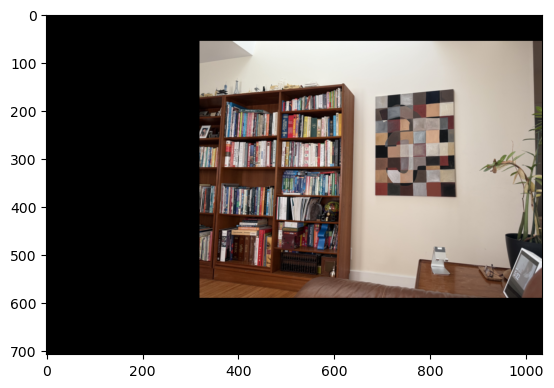

In [35]:
plt.imshow(mosaic_2)

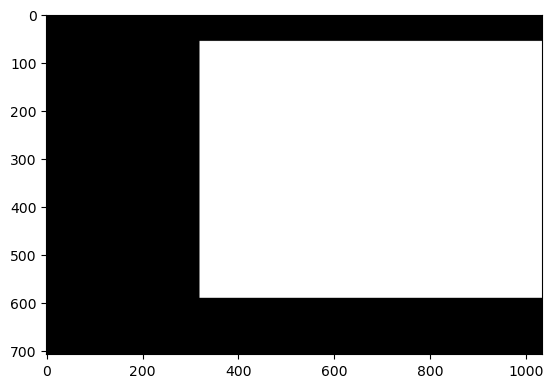

In [36]:
bw_1 = (color.rgb2gray(mosaic_1) > 0)
bw_2 = (color.rgb2gray(mosaic_2) > 0)
plt.imshow(bw_2, cmap = 'gray')

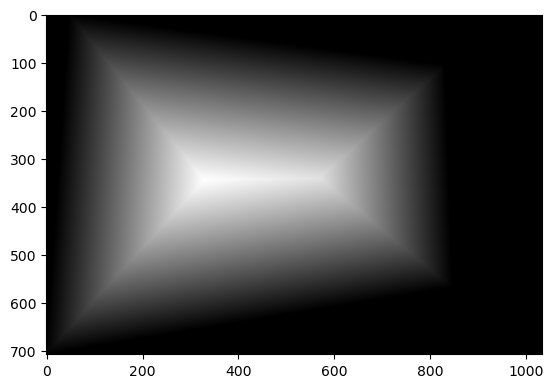

In [37]:
from scipy.ndimage import distance_transform_edt
D_map1 = normalize(distance_transform_edt(bw_1))
D_map2 = normalize(distance_transform_edt(bw_2))
plt.imshow(D_map1, cmap='gray')

iio.imwrite('./output/living_room_dmap1.jpg', img_as_ubyte(D_map1))
iio.imwrite('./output/living_room_dmap2.jpg', img_as_ubyte(D_map2))

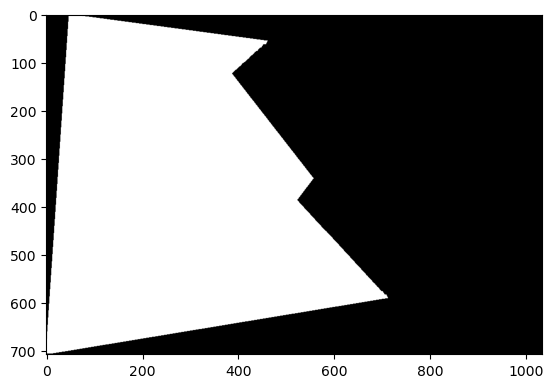

In [38]:
mask = (D_map1 > D_map2).astype(float)
plt.imshow(mask, cmap = 'gray')

iio.imwrite('./output/mask_living_room.jpg', img_as_ubyte(mask))

In [39]:
from helper import combined_color
mask_rgb = np.stack([mask, mask, mask], axis=-1)

combined_example = combined_color(mosaic_1, mosaic_2, mask_rgb, 5, 2, 2, 2)

empty_image = np.sum(combined_example, axis =0)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.18884828578531493..0.9978149802617834].


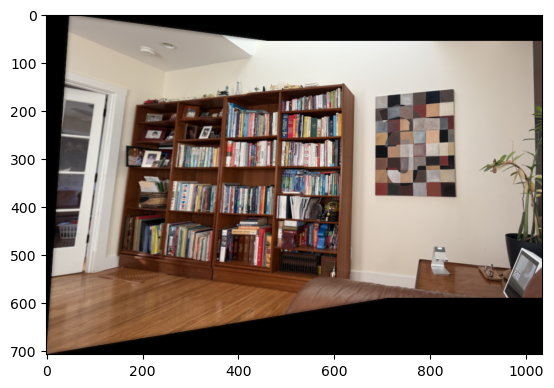

In [40]:
plt.imshow(empty_image)

In [76]:
def createMosaicWithoutBlending(im1, im2, H):

    h_base, w_base = im2.shape[:2]
    base_corners = np.array([
    [0, 0],
    [w_base-1, 0],
    [0, h_base-1],
    [w_base-1, h_base-1]
    ])

    warped_corners = corner_boundaries(im1, H)[:, :2]
    warped_x_min, warped_y_min = int(np.floor(warped_corners[:,0].min())), int(np.floor(warped_corners[:,1].min()))

    #now I can calculate exactly where my warped coordinates are in the final product

    all_corners = np.vstack([base_corners, warped_corners])
    x_min, y_min = np.floor(all_corners[:,0].min()), np.floor(all_corners[:,1].min()) 
    x_max, y_max = np.ceil(all_corners[:,0].max()), np.ceil(all_corners[:,1].max())

    canvas_width = int(x_max - x_min) #this is correct
    canvas_height = int(y_max - y_min) #this is also correct
    
    mosaic_im = np.zeros((canvas_height + 1, canvas_width + 1, 3), dtype=im2.dtype)
    

    offset_x = int(-x_min)
    offset_y = int(-y_min)

    new_base_corners = base_corners + np.array([offset_x, offset_y]) #both back into (0,0) territory
    
    new_x_min = warped_x_min + offset_x
    new_y_min = warped_y_min + offset_y

    warped_image = warpImageBilinear(im1, H)
    warp_h, warp_w = warped_image.shape[:2]
    dist_x = new_x_min
    dist_y = new_y_min

    mosaic_im[dist_y:dist_y + warp_h, dist_x:dist_x + warp_w] = warped_image
    mosaic_im[new_base_corners[0][1]:new_base_corners[2][1] + 1, new_base_corners[0][0]:new_base_corners[1][0] + 1] = im2
    
    return mosaic_im

[[-271.2968  -55.2428    1.    ]
 [ 510.9665   49.5271    1.    ]
 [-319.3333  650.9025    1.    ]
 [ 526.3629  511.9322    1.    ]]


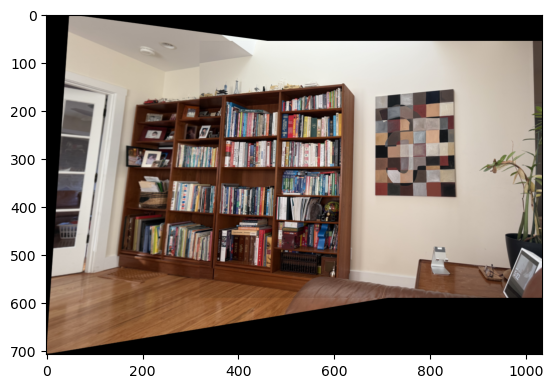

In [42]:
without_blending=createMosaicWithoutBlending(im1, im2, H)
plt.imshow(without_blending)
#iio.imwrite("./output/living_room_without_blending.jpg", img_as_ubyte(without_blending))

In [43]:
def blendMosaics(mosaic_1, mosaic_2):
    bw_1 = (color.rgb2gray(mosaic_1) > 0)
    bw_2 = (color.rgb2gray(mosaic_2) > 0)
    D_map1 = normalize(distance_transform_edt(bw_1))
    D_map2 = normalize(distance_transform_edt(bw_2)) 
    mask = (D_map1 > D_map2).astype(float)
    mask_rgb = np.stack([mask, mask, mask], axis=-1)

    combined_example = combined_color(mosaic_1, mosaic_2, mask_rgb, 5, 2, 2, 2)

    return np.sum(combined_example, axis =0)
    

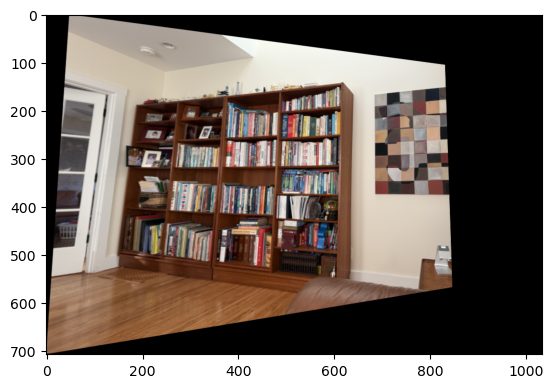

In [44]:
plt.imshow(mosaic_1)

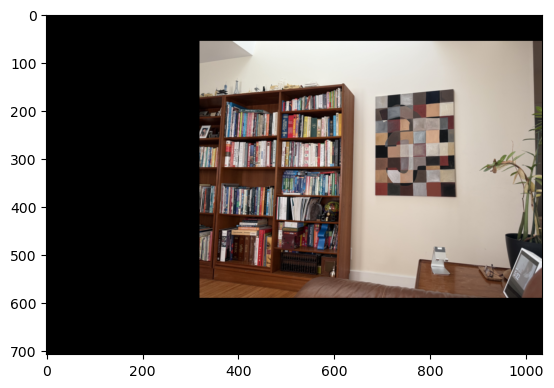

In [45]:
plt.imshow(mosaic_2)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.18884828578531493..0.9978149802617834].


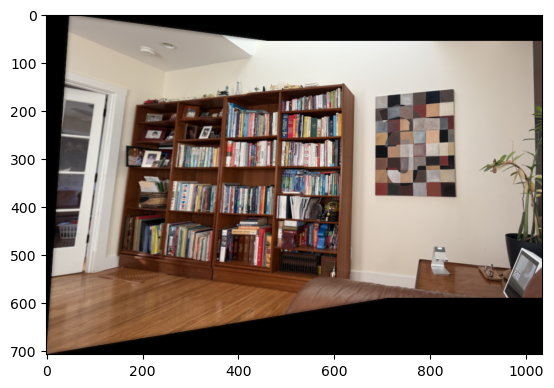

In [46]:
blended_living_room = blendMosaics(mosaic_1, mosaic_2)
plt.imshow(blended_living_room)

iio.imwrite('./output/living_room_blended.jpg', img_as_ubyte(blended_living_room))


In [47]:
#steps for blending
#calculate homography matrix
#create the mosaics --> this will have two outputs
#blend the mosaics --> this will have the final product

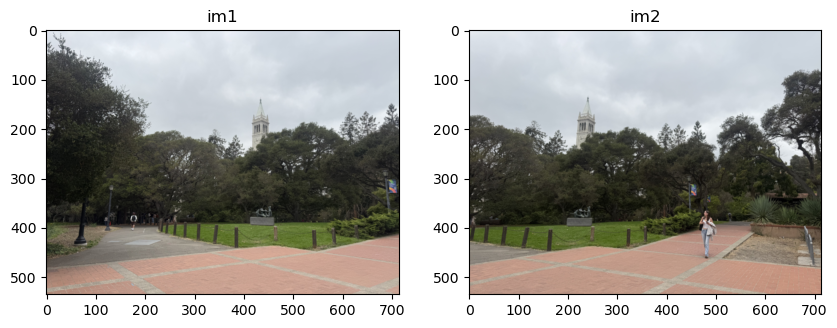

In [48]:
campanile_1 = iio.imread("./data/part1/campanile_1.png")
campanile_2 = iio.imread("./data/part1/campanile_2.png")

street_1_shape = (campanile_1.shape[0] // 8, campanile_1.shape[1] // 8)
street_2_shape = (campanile_2.shape[0] // 8, campanile_2.shape[1] // 8)


campanile_1 = resize(campanile_1, street_1_shape, anti_aliasing=True)
campanile_2 = resize(campanile_2, street_2_shape, anti_aliasing=True)

#iio.imwrite("./output/campanile_1_small.png", img_as_ubyte(campanile_1))
#iio.imwrite("./output/campanile_2_small.png", img_as_ubyte(campanile_2))

plt.figure(figsize=(10,5))

plt.subplot(1, 2, 1)   # second plot
plt.imshow(campanile_1)
plt.title("im1")

plt.subplot(1, 2, 2)   # 1 row, 2 columns, first plot
plt.imshow(campanile_2)
plt.title("im2")

plt.show()

In [49]:
#i want to morph street 2 to street 1
%matplotlib qt
street_points = get_points(campanile_1, campanile_2)

Click corresponding points between the two images (left ↔ right).
Click on Image 1, then on Image 2, alternating.
Press Enter (or right-click) when done.

Select next point on Image 1 (press Enter when done)...
Select corresponding point on Image 2...

Select next point on Image 1 (press Enter when done)...
Select corresponding point on Image 2...

Select next point on Image 1 (press Enter when done)...
Select corresponding point on Image 2...

Select next point on Image 1 (press Enter when done)...
Select corresponding point on Image 2...

Select next point on Image 1 (press Enter when done)...
Select corresponding point on Image 2...

Select next point on Image 1 (press Enter when done)...
Select corresponding point on Image 2...

Select next point on Image 1 (press Enter when done)...
Select corresponding point on Image 2...

Select next point on Image 1 (press Enter when done)...
Select corresponding point on Image 2...

Select next point on Image 1 (press Enter when done)...
Finis

In [50]:
show_selected_points(campanile_1, campanile_2, street_points)

8
[[-325.9834 -130.929     1.    ]
 [ 472.9834   70.2251    1.    ]
 [-496.3527  629.0657    1.    ]
 [ 459.5677  514.4171    1.    ]]


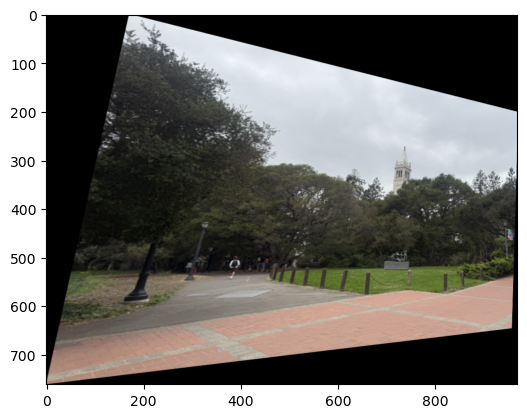

In [64]:
%matplotlib inline
print(len(street_points[0]))
H_street = computeH(street_points[0], street_points[1])
warped_campanile_1 = warpImageBilinear(campanile_1, H_street)
#warped_campanile_2 = warpImageNearestNeighbor(campanile_1, H_street)
plt.imshow(warped_campanile_1)
#print(H_street)
#iio.imwrite("./output/warped_campanile_bilinear.jpg", img_as_ubyte(warped_campanile_1))
#iio.imwrite("./output/warped_campanile_NN.jpg", img_as_ubyte(warped_campanile_2))

In [80]:
campanile_mosaic_1, campanile_mosaic_2= createMosaicsGeneralized(campanile_1, campanile_2, H_street)
#iio.imwrite("./output/campanile_mosaic_1.jpg", img_as_ubyte(campanile_mosaic_1))
#iio.imwrite("./output/campanile_mosaic_2.jpg", img_as_ubyte(campanile_mosaic_2))


[[-325.9834 -130.929     1.    ]
 [ 472.9834   70.2251    1.    ]
 [-496.3527  629.0657    1.    ]
 [ 459.5677  514.4171    1.    ]]


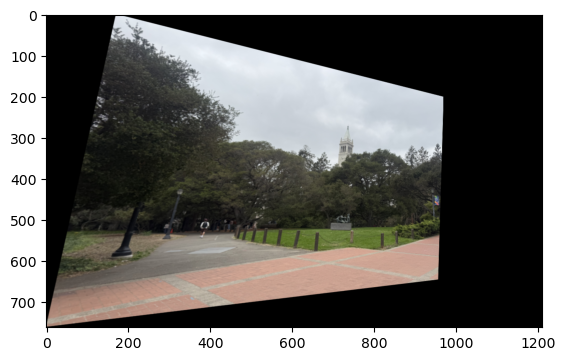

In [77]:
plt.imshow(campanile_mosaic_1)

[[-325.9834 -130.929     1.    ]
 [ 472.9834   70.2251    1.    ]
 [-496.3527  629.0657    1.    ]
 [ 459.5677  514.4171    1.    ]]


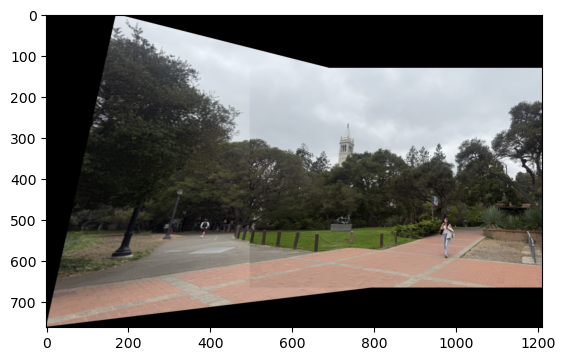

In [79]:
unblended_campanile = createMosaicWithoutBlending(campanile_1, campanile_2, H_street)
plt.imshow(unblended_campanile)
#iio.imwrite("./output/unblended_campanile.jpg", img_as_ubyte(unblended_campanile))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.19202136394379565..0.9983892037047579].


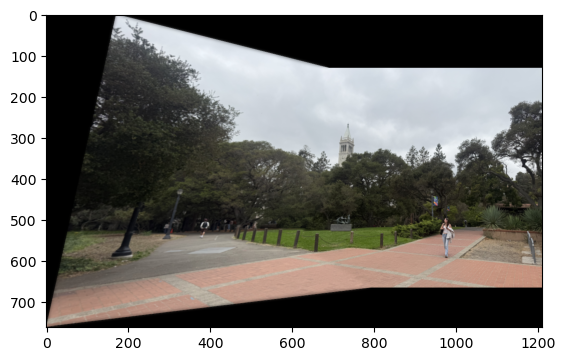

In [81]:
blended_campanile = blendMosaics(campanile_mosaic_1, campanile_mosaic_2)
plt.imshow(blended_campanile)
#iio.imwrite("./output/blended_campanile.jpg", img_as_ubyte(blended_campanile))

In [56]:
#1) load images
#2) Get correspondences
#3) caclualate H matrix
#4) Throw into createMosaics
#5) Throw into blendMOsaics

This is wurster

In [83]:
im1 = iio.imread('./data/part1/wurster_1.png')

im2 = iio.imread('./data/part1/wurster_2.png')

shape_1 = (im1.shape[0] // 8, im1.shape[1] // 8)
shape_2 = (im2.shape[0] // 8, im2.shape[1] // 8)


im1 = resize(im1, shape_1, anti_aliasing=True)
im2 = resize(im2, shape_2, anti_aliasing=True)

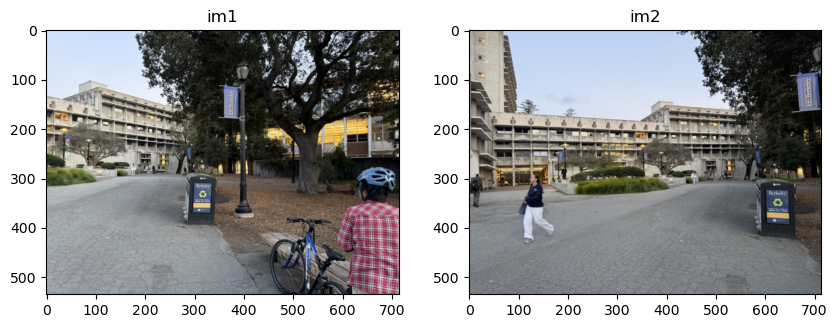

In [84]:
plt.figure(figsize=(10,5))

plt.subplot(1, 2, 1)   # second plot
plt.imshow(im1)
plt.title("im1")

plt.subplot(1, 2, 2)   # 1 row, 2 columns, first plot
plt.imshow(im2)
plt.title("im2")

plt.show()

In [59]:
%matplotlib qt
correspondences = get_points(im1, im2)


Click corresponding points between the two images (left ↔ right).
Click on Image 1, then on Image 2, alternating.
Press Enter (or right-click) when done.

Select next point on Image 1 (press Enter when done)...
Select corresponding point on Image 2...

Select next point on Image 1 (press Enter when done)...
Select corresponding point on Image 2...

Select next point on Image 1 (press Enter when done)...
Select corresponding point on Image 2...

Select next point on Image 1 (press Enter when done)...
Select corresponding point on Image 2...

Select next point on Image 1 (press Enter when done)...
Select corresponding point on Image 2...

Select next point on Image 1 (press Enter when done)...
Select corresponding point on Image 2...

Select next point on Image 1 (press Enter when done)...
Select corresponding point on Image 2...

Select next point on Image 1 (press Enter when done)...
Select corresponding point on Image 2...

Select next point on Image 1 (press Enter when done)...
Finis

In [60]:
%matplotlib inline
H = computeH(correspondences[0], correspondences[1])
mosaic1, mosaic2 = createMosaicsGeneralized(im1, im2, H)

[[ 317.5687   80.7697    1.    ]
 [1738.2459 -434.6438    1.    ]
 [ 341.3274  499.6952    1.    ]
 [1850.6499  895.622     1.    ]]


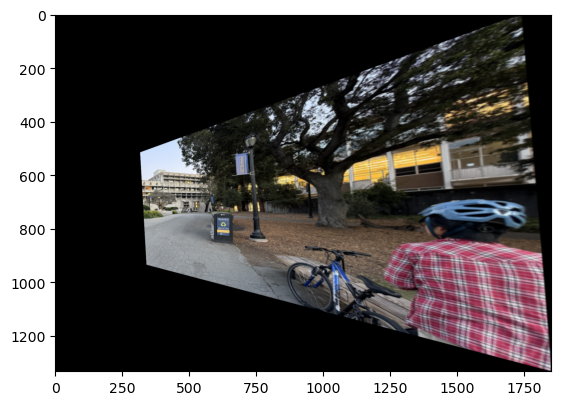

In [61]:
plt.imshow(mosaic1)

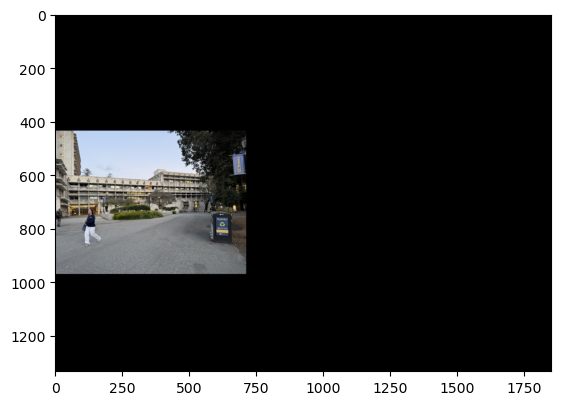

In [62]:
plt.imshow(mosaic2)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.13385799222175587..0.9996884123811882].


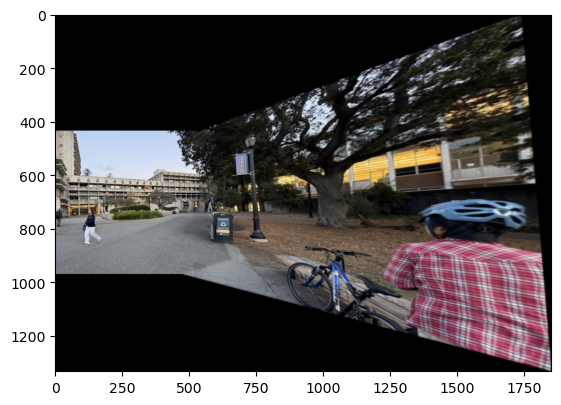

: 

In [ ]:
blended_mosaic = blendMosaics(mosaic1, mosaic2)
plt.imshow(blended_mosaic)

In [ ]:
#blended_mosaic = np.clip(blended_mosaic, 0, 1)

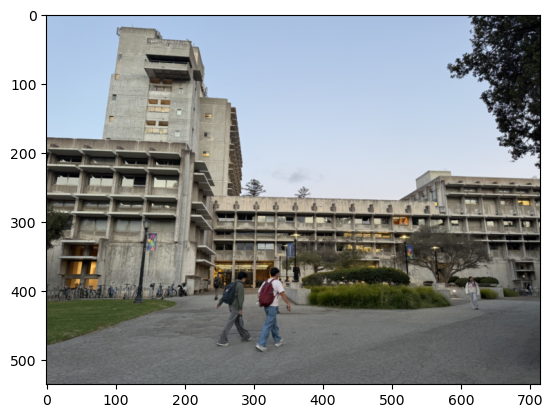

In [64]:
im3 = iio.imread('./data/part1/wurster_3.png')
shape_3 = (im3.shape[0] // 8, im3.shape[1] // 8)


im3 = resize(im3, shape_3, anti_aliasing=True)
plt.imshow(im3)

In [65]:
%matplotlib qt
more_correspondences = get_points(im3, blended_mosaic)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.13385799222175587..0.9996884123811882].


Click corresponding points between the two images (left ↔ right).
Click on Image 1, then on Image 2, alternating.
Press Enter (or right-click) when done.

Select next point on Image 1 (press Enter when done)...
Select corresponding point on Image 2...

Select next point on Image 1 (press Enter when done)...
Select corresponding point on Image 2...

Select next point on Image 1 (press Enter when done)...
Select corresponding point on Image 2...

Select next point on Image 1 (press Enter when done)...
Select corresponding point on Image 2...

Select next point on Image 1 (press Enter when done)...
Select corresponding point on Image 2...

Select next point on Image 1 (press Enter when done)...
Finished selecting points.

Collected 5 point pairs.
Points Image 1: [(259, 264), (564, 275), (268, 130), (365, 418), (228, 359)]
Points Image 2: [(79, 614), (391, 623), (75, 448), (203, 777), (41, 717)]


In [66]:
%matplotlib inline
H_more = computeH(more_correspondences[0], more_correspondences[1])
mosaic3, mosaic4 = createMosaicsGeneralized(im3, blended_mosaic, H_more)


[[-335.1307  223.9545    1.    ]
 [ 520.1031  354.2222    1.    ]
 [-246.3361  951.5937    1.    ]
 [ 511.7376  856.729     1.    ]]


-0.13385799222175587


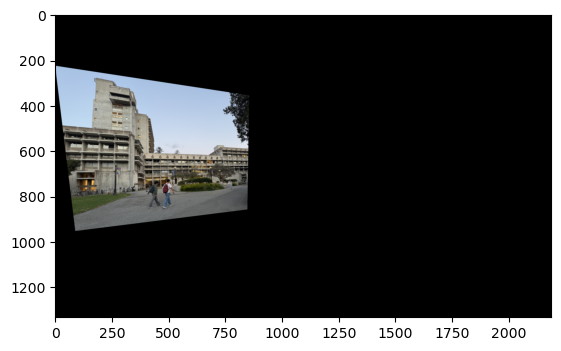

In [85]:
plt.imshow(mosaic3)

[[-335.1307  223.9545    1.    ]
 [ 520.1031  354.2222    1.    ]
 [-246.3361  951.5937    1.    ]
 [ 511.7376  856.729     1.    ]]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.13385799222175587..0.9996884123811882].


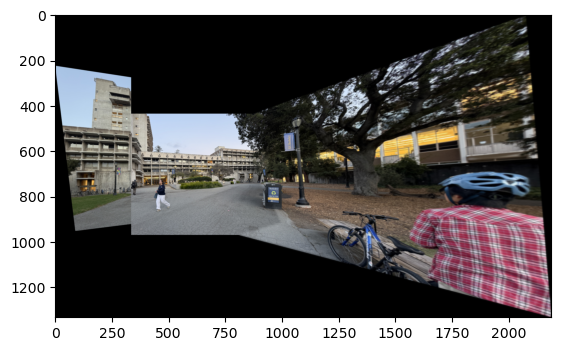

In [68]:
plt.imshow(createMosaicWithoutBlending(im3, blended_mosaic, H_more))

In [ ]:
final_blended = blendMosaics(mosaic3, mosaic4)


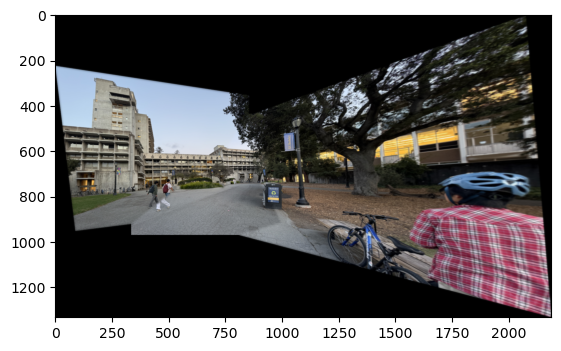

In [78]:
final_blended = np.clip(final_blended, 0, 1)
plt.imshow(final_blended)

In [79]:
iio.imwrite("./output/wurster_3_photos.jpg", img_as_ubyte(final_blended))

Lets get started on the corner detection!

In [188]:
from skimage.feature import corner_harris, peak_local_max
def get_harris_corners(im, edge_discard=20):
    """
    This function takes a b&w image and an optional amount to discard
    on the edge (default is 5 pixels), and finds all harris corners
    in the image. Harris corners near the edge are discarded and the
    coordinates of the remaining corners are returned. A 2d array (h)
    containing the h value of every pixel is also returned.

    h is the same shape as the original image, im.
    coords is 2 x n (ys, xs).
    """

    assert edge_discard >= 20

    # find harris corners
    h = corner_harris(im, method='eps', sigma=1)
    
    coords = peak_local_max(h, min_distance=10)

    # discard points on edge
    edge = edge_discard  # pixels
    
    mask = (coords[:, 0] > edge) & \
           (coords[:, 0] < im.shape[0] - edge) & \
           (coords[:, 1] > edge) & \
           (coords[:, 1] < im.shape[1] - edge)
    coords = coords[mask].T
    return h, coords


def dist2(x, c):
    """
    dist2  Calculates squared distance between two sets of points.

    Description
    D = DIST2(X, C) takes two matrices of vectors and calculates the
    squared Euclidean distance between them.  Both matrices must be of
    the same column dimension.  If X has M rows and N columns, and C has
    L rows and N columns, then the result has M rows and L columns.  The
    I, Jth entry is the  squared distance from the Ith row of X to the
    Jth row of C.

    Adapted from code by Christopher M Bishop and Ian T Nabney.
    """

    ndata, dimx = x.shape
    ncenters, dimc = c.shape
    assert dimx == dimc, 'Data dimension does not match dimension of centers'

    return (np.ones((ncenters, 1)) * np.sum((x**2).T, axis=0)).T + \
            np.ones((   ndata, 1)) * np.sum((c**2).T, axis=0)    - \
            2 * np.inner(x, c)

In [189]:
def show_corner_points(im1, coords):
    
    fig, ax = plt.subplots(1, 1, figsize=(10, 5))
    ax.imshow(im1)
    ax.set_title("Image 1 (with selected points)")

    # plot points - coords is 2 x n where coords[0] is y, coords[1] is x
    for i in range(coords.shape[1]):
        x = coords[1, i]
        y = coords[0, i]
        ax.plot(x, y, 'ro', markersize=3)
        #ax.text(x + 5, y - 5, f"{i+1}", color='black', fontsize=10, weight='bold')

    plt.tight_layout()
    plt.show()

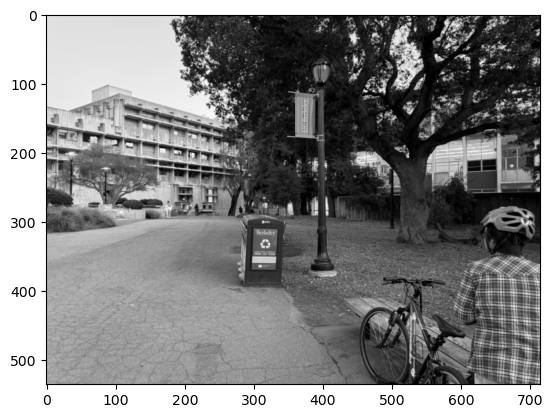

In [190]:
gray_im1 = color.rgb2gray(im1)
plt.imshow(gray_im1, cmap = 'gray')
iio.imwrite("./output/part2/wurster_1_gray.jpg", img_as_ubyte(gray_im1))

In [191]:
h_1, coords_1 = get_harris_corners(gray_im1)
print(coords_1)

[[111 146  85 ...  31  34  22]
 [464 283 575 ...  72 122  98]]


3.068138750223081e-05


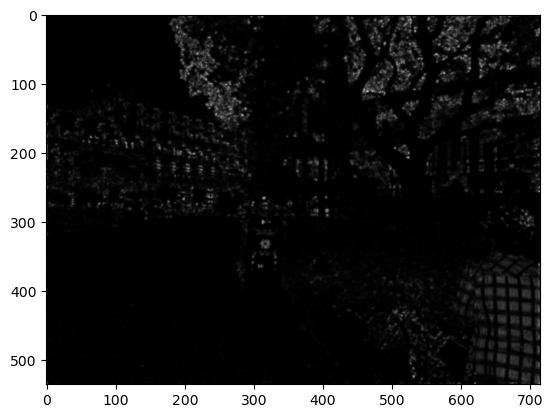

In [192]:
plt.imshow(h_1, cmap='gray')
#iio.imwrite("./output/part2/wurster_1_harris_vals.jpg", img_as_ubyte(normalize(h_1)))
print(h_1[100,100])

3.068138750223081e-05


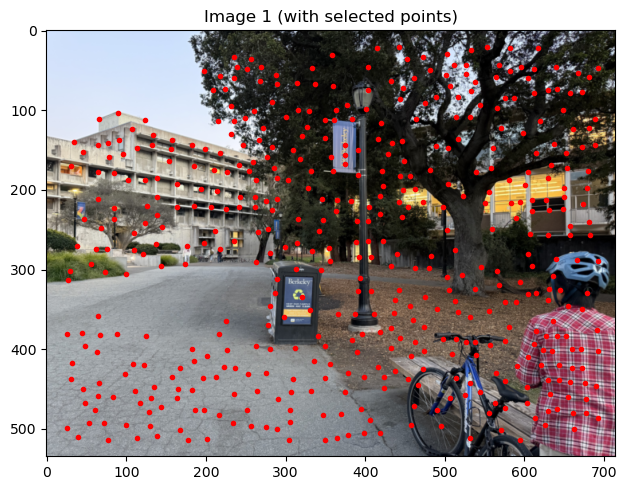

In [198]:
h_values = h_1[coords_1[0, :], coords_1[1, :]] #get all the values associated at those coords
print(h_1[100, 100])
#print(h_values)
top_indices = np.argsort(h_values)[::-1][:500] #now figure out which ones are the highest, based on passed in
#print(top_indices[:250])
top_coords = coords_1[:, top_indices] #grab those top coordinates
#show_corner_points(im1, coords_1[:, :250])
show_corner_points(im1, top_coords)
#hooray!

In [184]:
print(coords_1)
print(coords_1.T)

[[111 146  85 ...  27  65  31]
 [464 283 575 ... 130  44 114]]
[[111 464]
 [146 283]
 [ 85 575]
 ...
 [ 27 130]
 [ 65  44]
 [ 31 114]]


In [199]:
def ANMS(im, c_robust, num_points=500, h_thresh=1e-4):
    hc, points = get_harris_corners(im)
    all_rs = []
    #generate each supression radius for point i
    #sort and then return the points
    h_values = hc[points[0, :], points[1, :]]
    all_dist = dist2(points.T,points.T)
    for i in range(all_dist.shape[0]):
        if h_values[i] < h_thresh:
            # if the Harris response is too small, ignore it
            r_i = 0
        else:
            mask = h_values[i] < c_robust * h_values #only keep values s.t c_robust * h[j] still exceeds the val of h[i]
            valid_distance = all_dist[i, mask] #grab the valid distances from the ith row. (ie this is the s.t. condition)
            r_i = valid_distance.min() if len(valid_distance) > 0 else 0 #only compute distance if not 0. 
        all_rs.append(r_i)
    
    best_indices = np.argsort(all_rs)[::-1][:num_points-1]
    #need to find the best_indice with the largest value
    max_indice = np.argsort(h_values)[::-1][0]
    best_indices = np.append(best_indices, max_indice)
    return points[:, best_indices]
    

In [200]:
ANMS_points = ANMS(gray_im1, 0.9, 250)

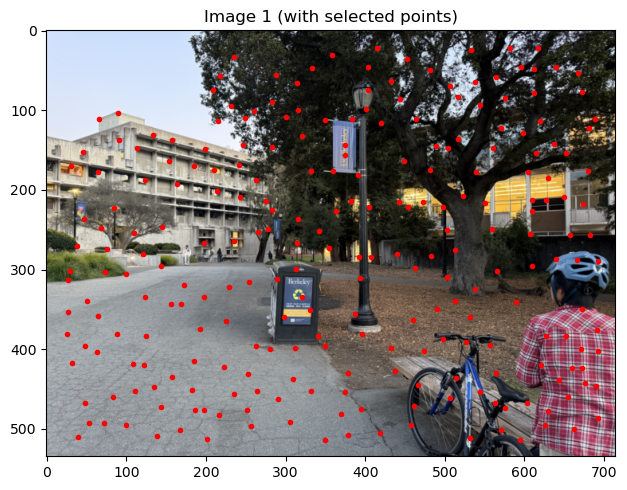

In [201]:
show_corner_points(im1, ANMS_points)

In [367]:
def create_feature_for_pixel(im, y_corner, x_corner):
    patch_size = 40
    val_patch = np.zeros((patch_size,patch_size))

    for y in range(0, patch_size):
        for x in range(patch_size):
            val_patch[y, x] = im[y + y_corner - patch_size//2, x + x_corner - patch_size//2]
    downsampled = resize(val_patch, (8, 8), anti_aliasing=True)
    downsampled = (downsampled - downsampled.mean()) / (downsampled.std() + 1e-8)
    return downsampled


In [368]:
random_patch = create_feature_for_pixel(gray_im1, coords_1[0, 20], coords_1[1, 20])
print(np.min(random_patch))

-2.2388007160555072


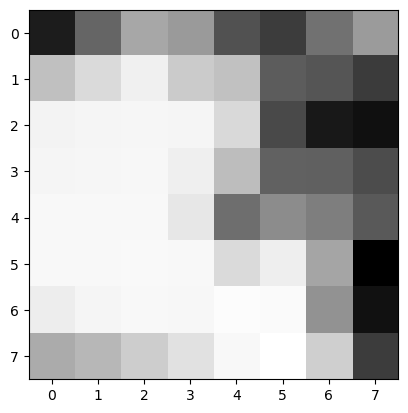

In [369]:
plt.imshow(normalize(random_patch), cmap='gray')

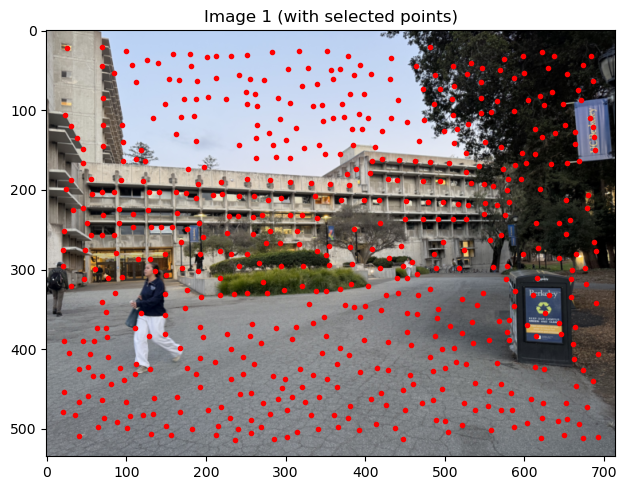

In [370]:
gray_im2 = color.rgb2gray(im2)
get_corners_h_2, coords_2 = get_harris_corners(gray_im2)
show_corner_points(im2, coords_2)

In [371]:
def get_all_patches(im, coords):
    patches = []
    for i in range(coords.shape[1]):
        y_x_cord = (coords[0, i], coords[1,i])
        patch = create_feature_for_pixel(im, coords[0, i], coords[1,i])
        patches.append([y_x_cord, patch])
    return patches

In [372]:
all_patches_1 = get_all_patches(gray_im1, coords_1)
all_patches_2 = get_all_patches(gray_im2, coords_2)

In [373]:
def match_patches(patches_im1, patches_im2, cutoff):
    #patches_im1 is a list that has [(cords), feature_descriptor]
    best_match_patches = []
    
    for patch_1 in patches_im1:
        feature_proximity = []
        for patch_2 in patches_im2:
            feature_1 = patch_1[1].flatten()
            feature_2 = patch_2[1].flatten()
            get_dist = np.linalg.norm(feature_1 - feature_2)
            feature_proximity.append([get_dist, patch_1[0], patch_2[0]]) #dist, im1_cord, im2_cord
        feature_proximity.sort(key = lambda x: x[0])
        e1 = feature_proximity[0][0]
        e2 = feature_proximity[1][0]
        if e1/(e2 + 1e-8) < cutoff:
            best_match_patches.append(feature_proximity[0])
    return best_match_patches
            

In [374]:
match_patches = match_patches(all_patches_1, all_patches_2, 0.6)

In [375]:
print(match_patches)

[[np.float64(3.590635331975847), (np.int64(94), np.int64(231)), (np.int64(106), np.int64(510))], [np.float64(3.6656612248466), (np.int64(75), np.int64(209)), (np.int64(92), np.int64(487))], [np.float64(4.026540697773254), (np.int64(299), np.int64(313)), (np.int64(311), np.int64(616))], [np.float64(3.066737243290249), (np.int64(267), np.int64(198)), (np.int64(281), np.int64(487))], [np.float64(1.7824287769017826), (np.int64(51), np.int64(197)), (np.int64(73), np.int64(473))], [np.float64(2.201976572871551), (np.int64(176), np.int64(359)), (np.int64(163), np.int64(668))], [np.float64(3.414040770986052), (np.int64(225), np.int64(283)), (np.int64(231), np.int64(575))], [np.float64(2.1478779091097566), (np.int64(251), np.int64(211)), (np.int64(265), np.int64(498))], [np.float64(3.9471387013232166), (np.int64(254), np.int64(110)), (np.int64(274), np.int64(409))], [np.float64(2.202765667055774), (np.int64(281), np.int64(121)), (np.int64(298), np.int64(419))], [np.float64(2.080424479342644), (

In [376]:
#Here's the modified version with im2 on the left:
def plot_matched_patches(im1, im2, matched_patches):
    """
    im1, im2: np.array images (H x W x 3 or H x W)
    matched_patches: list of [feature, (y1, x1), (y2, x2)] pairs
    """

    # Make a combined canvas
    h1, w1 = im1.shape[:2]
    h2, w2 = im2.shape[:2]
    height = max(h1, h2)
    combined = np.zeros((height, w1 + w2, 3), dtype=im1.dtype)

    # Place im2 on the left, im1 on the right
    combined[:h2, :w2] = im2
    combined[:h1, w2:w2 + w1] = im1

    plt.figure(figsize=(12, 6))
    plt.imshow(combined)
    plt.axis('off')

    # Plot the matches
    for _, (y1, x1), (y2, x2) in matched_patches:
        # Shift x1 by w2 since im1 is now on the right
        plt.plot([x2, x1 + w2], [y2, y1], '-', linewidth=1, alpha=0.6)
        plt.scatter([x2, x1 + w2], [y2, y1], s=20)

    plt.show()

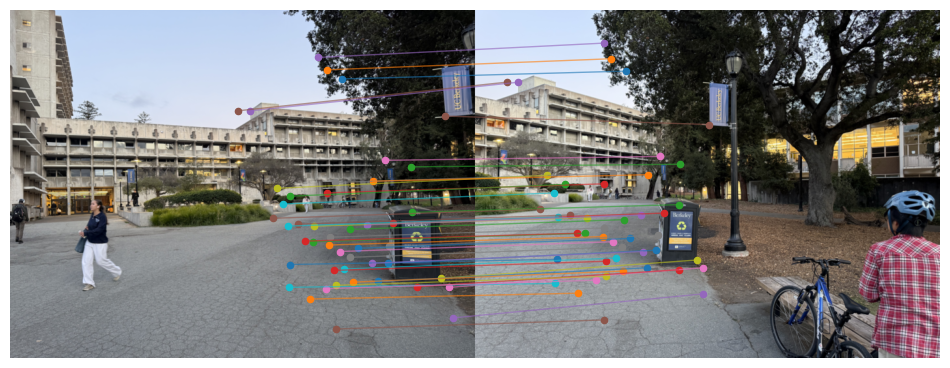

In [377]:
plot_matched_patches(normalize(im1), normalize(im2), match_patches)

In [378]:
#remember warping im1 to im2

In [379]:
import random
#next part -- the algorithm for computing inliers, then H
def RANSAC(matched_patches, error, iters=1):
    best_inliers = []
    all_y_x_1 = [match[1] for match in matched_patches]
    all_y_x_2 = [match[2] for match in matched_patches]

    all_x_y_1 = [(x, y) for (y,x) in all_y_x_1]
    all_x_y_2 = [(x, y) for (y,x) in all_y_x_2]
    for _ in range(iters):
        sampled_matches = random.sample(matched_patches, 4)
        y_x_1 = [match[1] for match in sampled_matches]
        y_x_2 = [match[2] for match in sampled_matches]
        
        #redo for x_y order
        x_y_1 = [(x, y) for (y,x) in y_x_1]
        x_y_2 = [(x, y) for (y,x) in y_x_2]

        H = computeH(x_y_1, x_y_2) #remember, warping im1 to im2
        
        #print(y_x_1)
        #print(x_y_1) #sanity check

        pts1 = np.array(all_x_y_1, dtype=float) #lets now warp all of pts1 and see how well the Homography does
        pts1_h = np.hstack([pts1, np.ones((pts1.shape[0], 1))])  
        mapped_h = (H @ pts1_h.T).T  
        mapped = mapped_h[:, :2] / mapped_h[:, [2]] 
        #print(len(mapped))
        #now we compute the euclidean distance between mapped and x_y_2
        count_inliers = []
        for i in range(len(mapped)):
            dist = np.linalg.norm(np.array(all_x_y_2[i]) - np.array(mapped[i]))
            #print(dist)
            if dist < error:
                count_inliers.append([all_x_y_1[i], all_x_y_2[i]])

        best_inliers.append(count_inliers)
    
    best_max = max(best_inliers, key=lambda x: len(x))
    print(len(best_max))
    best_im1_points = [points[0] for points in best_max]
    best_im2_points = [points[1] for points in best_max]
    
    best_H = computeH(best_im1_points, best_im2_points)
    print(best_H)
    return best_H



        



In [380]:
best_H = RANSAC(match_patches, 5, 1000)

46
[[ 3.72635453e-01  3.05918059e-02  3.15559766e+02]
 [-2.83312059e-01  7.91084647e-01  7.47825953e+01]
 [-8.66775499e-04 -4.67038805e-05  1.00000000e+00]]


[[ 3.15559766e+02  7.47825953e+01  1.00000000e+00]
 [ 1.52163737e+03 -3.33043307e+02  1.00000000e+00]
 [ 3.40384947e+02  5.09939626e+02  1.00000000e+00]
 [ 1.67367655e+03  8.26833671e+02  1.00000000e+00]]


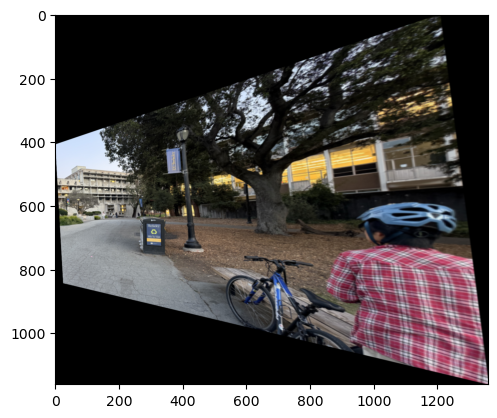

In [381]:
plt.imshow(warpImageBilinear(im1, best_H))